In [1]:
# ===============================
# U-NET TESTING / EVALUATION
# ===============================

import os
import cv2
import torch
import numpy as np
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from tqdm import tqdm

# ===============================
# CONFIG
# ===============================
DATASET_DIR = r"E:\processed_segmentation_dataset_224"
MODEL_PATH = r"E:\project\models\tampering_unet_finetuned.pth"

BATCH_SIZE = 16
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Using device:", DEVICE)

# ===============================
# DATASET (TEST)
# ===============================
class SegmentationDataset(Dataset):
    def __init__(self, root, split):
        self.image_dir = os.path.join(root, split, "images")
        self.mask_dir = os.path.join(root, split, "masks")
        self.images = sorted(os.listdir(self.image_dir))
        self.transform = transforms.ToTensor()

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.images[idx])

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(mask_path, 0) / 255.0

        image = self.transform(image)
        mask = torch.from_numpy(mask).float().unsqueeze(0)

        return image, mask

test_ds = SegmentationDataset(DATASET_DIR, "test")
test_loader = DataLoader(
    test_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

print("Test samples:", len(test_ds))

# ===============================
# MODEL
# ===============================
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        def CBR(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
            )

        self.enc1 = CBR(3, 64)
        self.enc2 = CBR(64, 128)
        self.enc3 = CBR(128, 256)
        self.enc4 = CBR(256, 512)

        self.pool = nn.MaxPool2d(2)
        self.bottleneck = CBR(512, 1024)

        self.up4 = nn.ConvTranspose2d(1024, 512, 2, 2)
        self.dec4 = CBR(1024, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, 2, 2)
        self.dec3 = CBR(512, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.dec2 = CBR(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.dec1 = CBR(128, 64)

        self.final = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b = self.bottleneck(self.pool(e4))
        d4 = self.dec4(torch.cat([self.up4(b), e4], dim=1))
        d3 = self.dec3(torch.cat([self.up3(d4), e3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return self.final(d1)

model = UNet().to(DEVICE)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.eval()

print("✅ Loaded fine-tuned model")

# ===============================
# METRICS
# ===============================
iou_list, dice_list, acc_list, prec_list, rec_list = [], [], [], [], []

with torch.no_grad():
    for imgs, masks in tqdm(test_loader, desc="Testing"):
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)

        preds = torch.sigmoid(model(imgs)) > 0.5

        TP = (preds & masks.bool()).float().sum()
        TN = ((~preds) & (~masks.bool())).float().sum()
        FP = (preds & (~masks.bool())).float().sum()
        FN = ((~preds) & masks.bool()).float().sum()

        iou = (TP + 1e-6) / (TP + FP + FN + 1e-6)
        dice = (2 * TP + 1e-6) / (2 * TP + FP + FN + 1e-6)
        acc = (TP + TN) / (TP + TN + FP + FN + 1e-6)
        prec = TP / (TP + FP + 1e-6)
        rec = TP / (TP + FN + 1e-6)

        iou_list.append(iou.item())
        dice_list.append(dice.item())
        acc_list.append(acc.item())
        prec_list.append(prec.item())
        rec_list.append(rec.item())

# ===============================
# FINAL RESULTS
# ===============================
print("\n📊 FINAL TEST RESULTS")
print(f"IoU Score        : {np.mean(iou_list):.4f}")
print(f"Dice Coefficient : {np.mean(dice_list):.4f}")
print(f"Pixel Accuracy  : {np.mean(acc_list):.4f}")
print(f"Precision       : {np.mean(prec_list):.4f}")
print(f"Recall          : {np.mean(rec_list):.4f}")


Using device: cuda
Test samples: 5500
✅ Loaded fine-tuned model


Testing: 100%|███████████████████████████████████████████████████████████████████████| 344/344 [01:07<00:00,  5.10it/s]


📊 FINAL TEST RESULTS
IoU Score        : 0.3214
Dice Coefficient : 0.4256
Pixel Accuracy  : 0.9535
Precision       : 0.4389
Recall          : 0.4258


✅ Model loaded for random testing


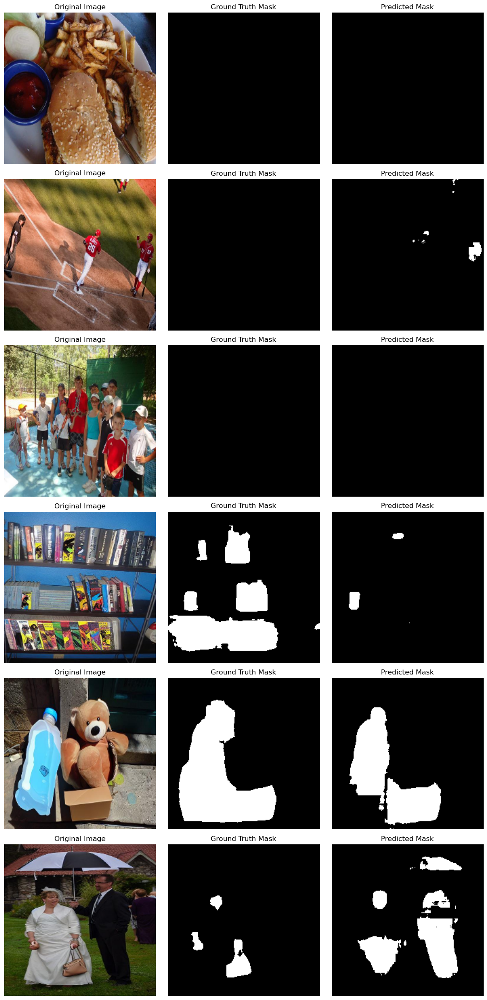

In [3]:
# ===============================
# RANDOM TEST VISUALIZATION
# ===============================

import os
import cv2
import torch
import random
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from torchvision import transforms

# ===============================
# CONFIG
# ===============================
DATASET_DIR = r"E:\processed_segmentation_dataset_224"
MODEL_PATH = r"E:\project\models\tampering_unet_finetuned.pth"

NUM_SAMPLES = 6          # 🔥 change to 5–10 if needed
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# ===============================
# DATASET
# ===============================
class SegmentationDataset(Dataset):
    def __init__(self, root, split):
        self.image_dir = os.path.join(root, split, "images")
        self.mask_dir = os.path.join(root, split, "masks")
        self.images = sorted(os.listdir(self.image_dir))
        self.transform = transforms.ToTensor()

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.images[idx])

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(mask_path, 0) / 255.0

        image_t = self.transform(image)
        mask_t = torch.from_numpy(mask).float()

        return image, image_t, mask_t

# ===============================
# LOAD DATA & MODEL
# ===============================
test_ds = SegmentationDataset(DATASET_DIR, "test")

model = torch.load(
    MODEL_PATH,
    map_location=DEVICE
) if False else None  # placeholder to avoid confusion

# Rebuild model architecture
from torch import nn

class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        def CBR(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
            )

        self.enc1 = CBR(3, 64)
        self.enc2 = CBR(64, 128)
        self.enc3 = CBR(128, 256)
        self.enc4 = CBR(256, 512)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck = CBR(512, 1024)
        self.up4 = nn.ConvTranspose2d(1024, 512, 2, 2)
        self.dec4 = CBR(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, 2)
        self.dec3 = CBR(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.dec2 = CBR(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.dec1 = CBR(128, 64)
        self.final = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b = self.bottleneck(self.pool(e4))
        d4 = self.dec4(torch.cat([self.up4(b), e4], dim=1))
        d3 = self.dec3(torch.cat([self.up3(d4), e3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return self.final(d1)

model = UNet().to(DEVICE)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.eval()

print("✅ Model loaded for random testing")

# ===============================
# RANDOM SAMPLE VISUALIZATION
# ===============================
indices = random.sample(range(len(test_ds)), NUM_SAMPLES)

plt.figure(figsize=(12, 4 * NUM_SAMPLES))

for i, idx in enumerate(indices):
    image, image_t, mask = test_ds[idx]

    with torch.no_grad():
        pred = torch.sigmoid(
            model(image_t.unsqueeze(0).to(DEVICE))
        )[0, 0].cpu().numpy()

    pred_bin = (pred > 0.5).astype(np.uint8)

    # Plot
    plt.subplot(NUM_SAMPLES, 3, i * 3 + 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(NUM_SAMPLES, 3, i * 3 + 2)
    plt.imshow(mask, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(NUM_SAMPLES, 3, i * 3 + 3)
    plt.imshow(pred_bin, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

plt.tight_layout()
plt.show()


Using device: cuda
✅ Model loaded


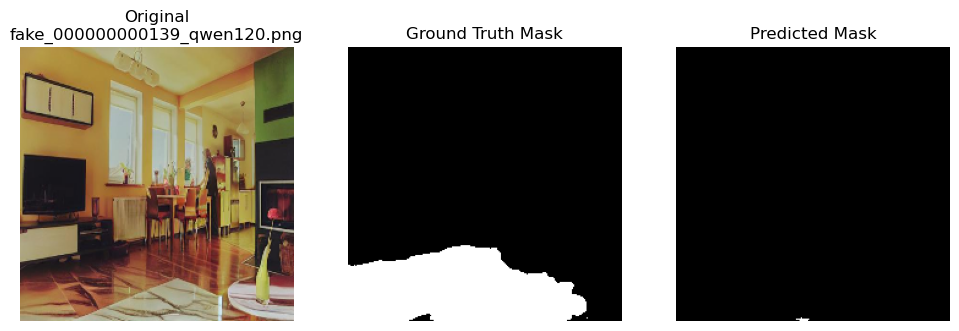

Press ENTER for next image, or type 'q' to quit:  ENTER


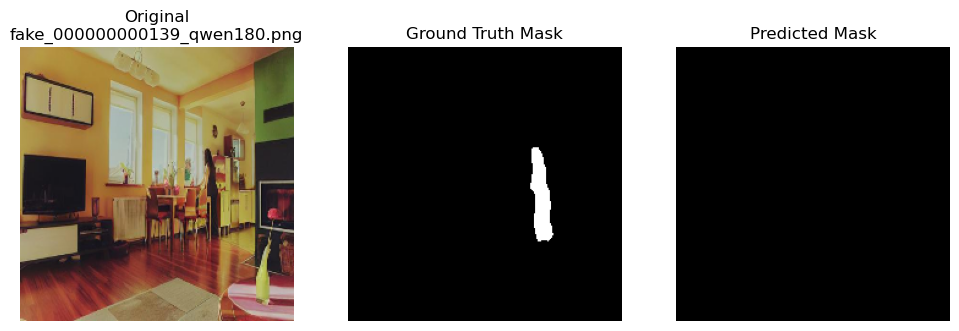

Press ENTER for next image, or type 'q' to quit:  ENTER


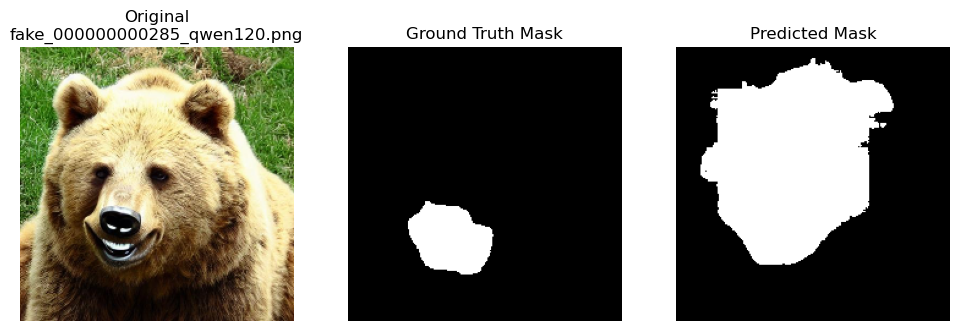

Press ENTER for next image, or type 'q' to quit:  ENTER


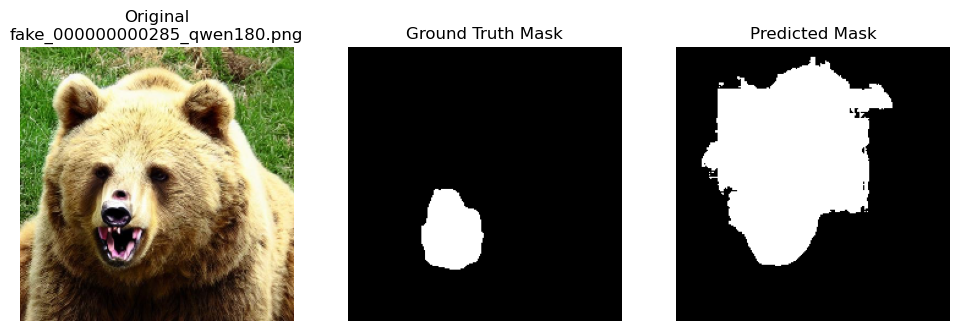

Press ENTER for next image, or type 'q' to quit:  ENTER


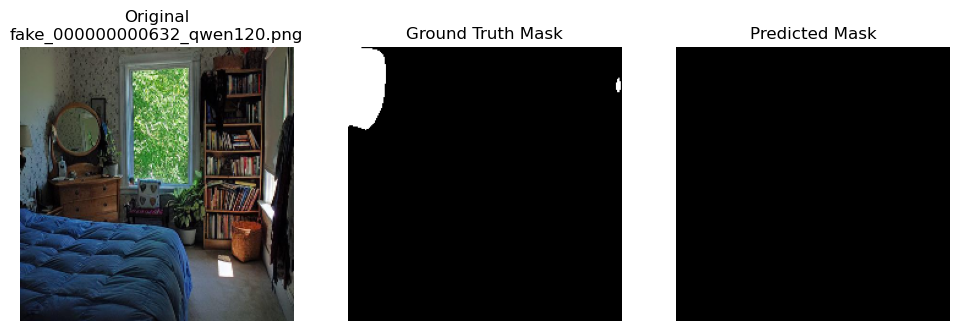

Press ENTER for next image, or type 'q' to quit:  ENTER


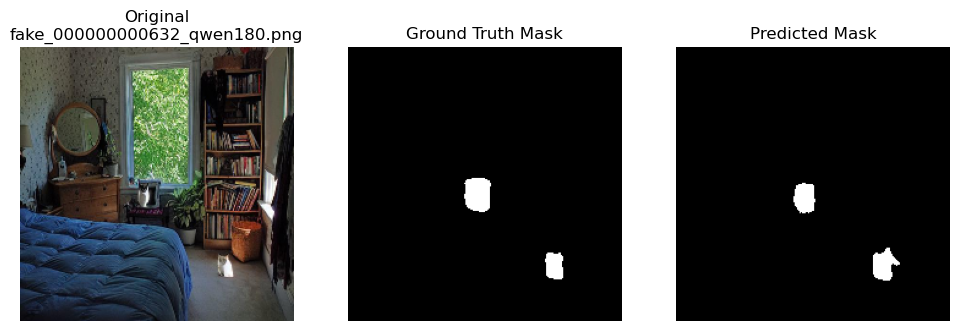

Press ENTER for next image, or type 'q' to quit:  ENTER


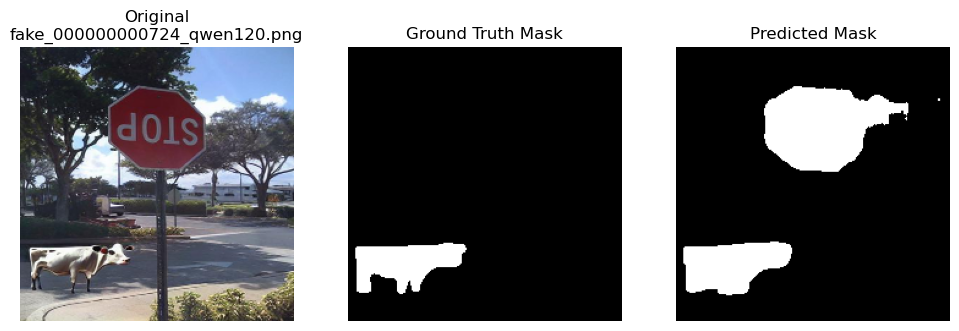

Press ENTER for next image, or type 'q' to quit:  ENTER


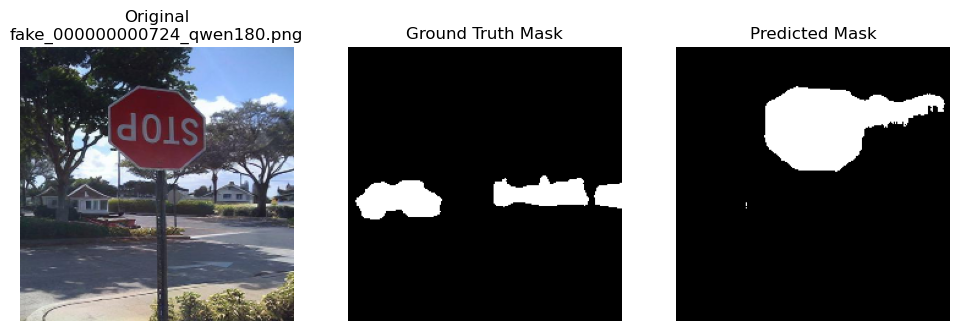

Press ENTER for next image, or type 'q' to quit:  ENTER


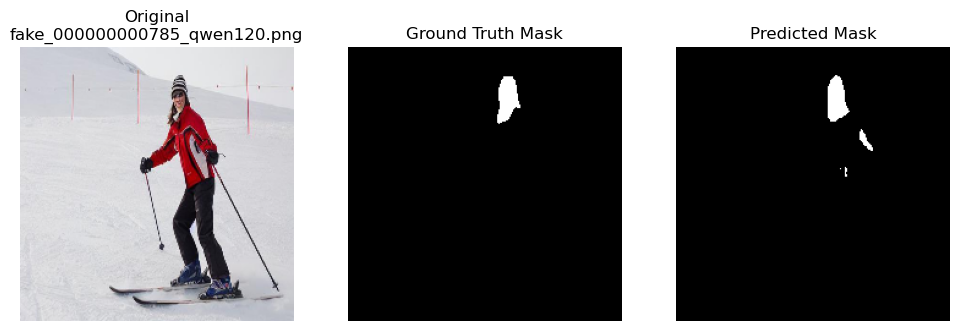

Press ENTER for next image, or type 'q' to quit:  ENTER


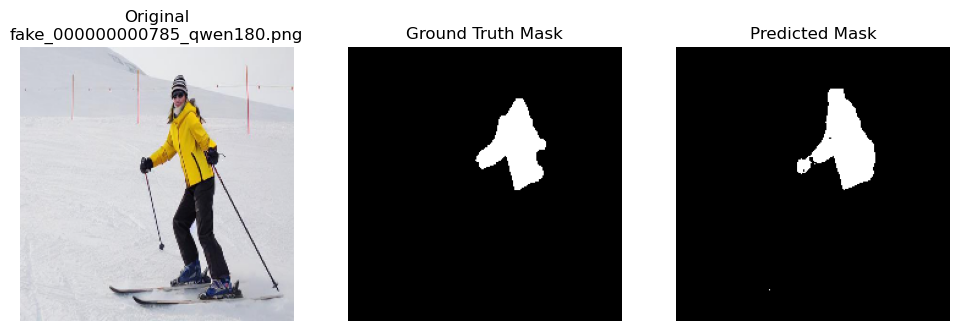

Press ENTER for next image, or type 'q' to quit:  ENTER


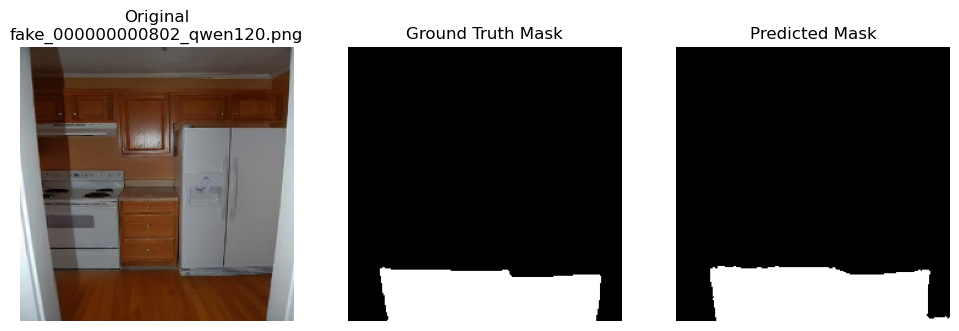

Press ENTER for next image, or type 'q' to quit:  ENTER


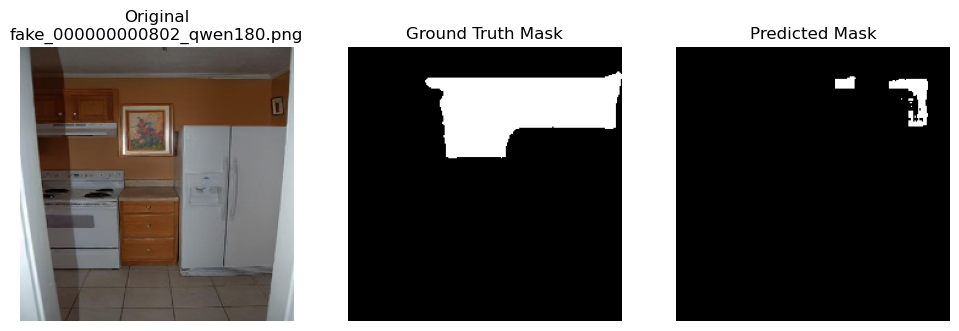

Press ENTER for next image, or type 'q' to quit:  ENTER


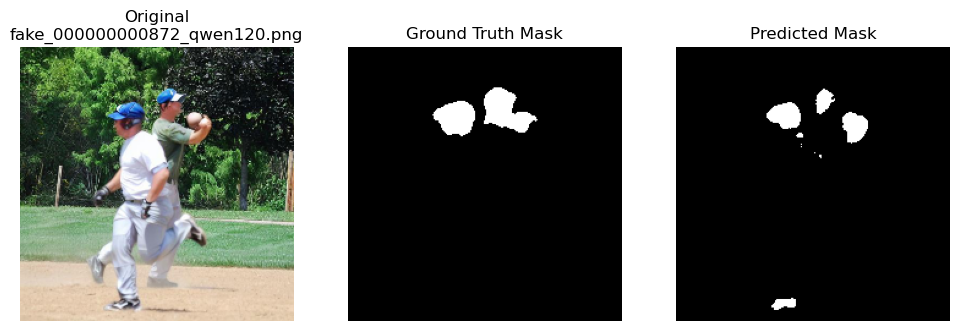

Press ENTER for next image, or type 'q' to quit:  ENTER


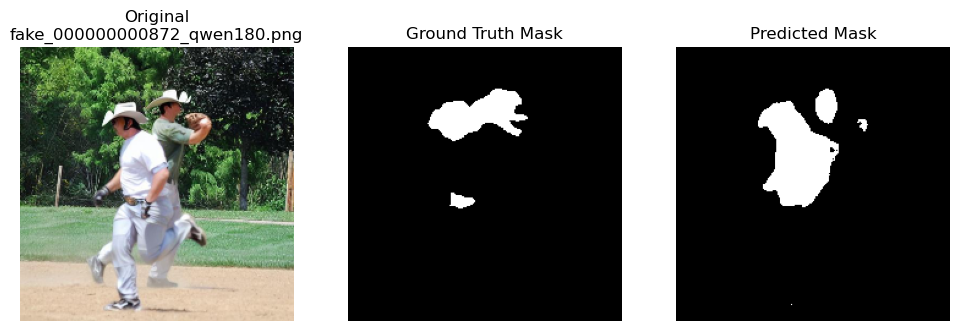

Press ENTER for next image, or type 'q' to quit:  ENTER


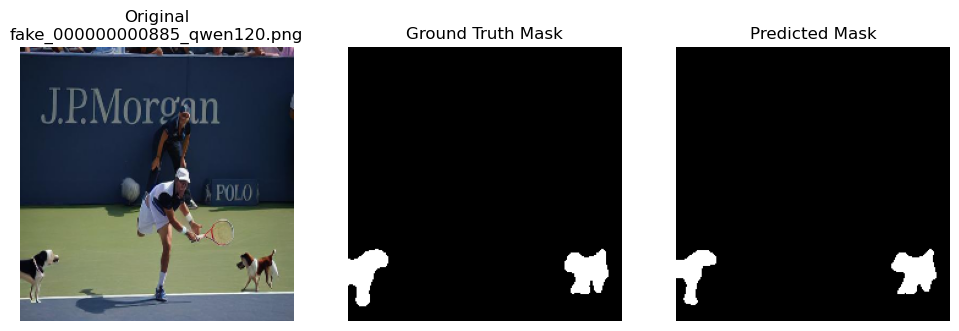

Press ENTER for next image, or type 'q' to quit:  ENTER


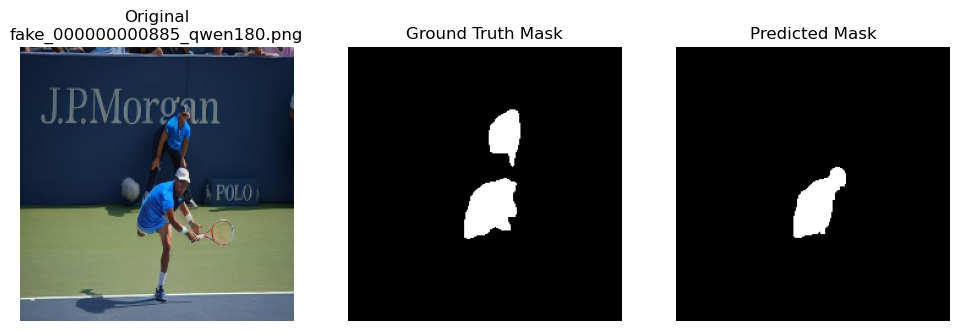

Press ENTER for next image, or type 'q' to quit:  ENTER


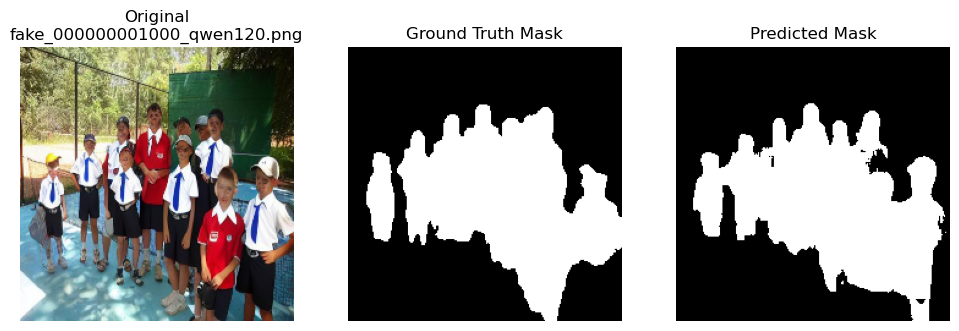

Press ENTER for next image, or type 'q' to quit:  ENTER


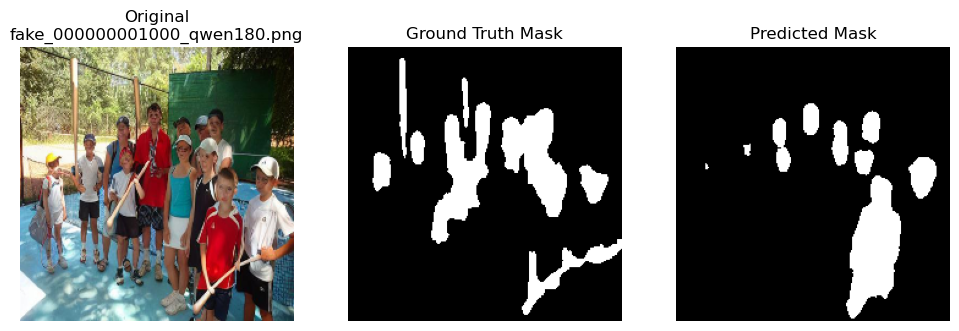

Press ENTER for next image, or type 'q' to quit:  ENTER


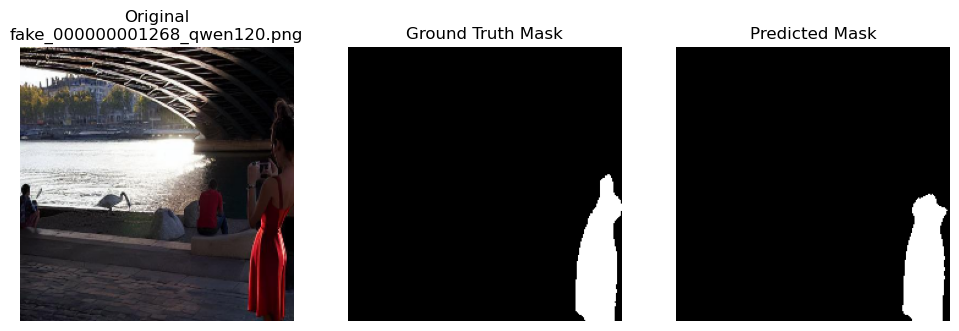

Press ENTER for next image, or type 'q' to quit:  ENTER


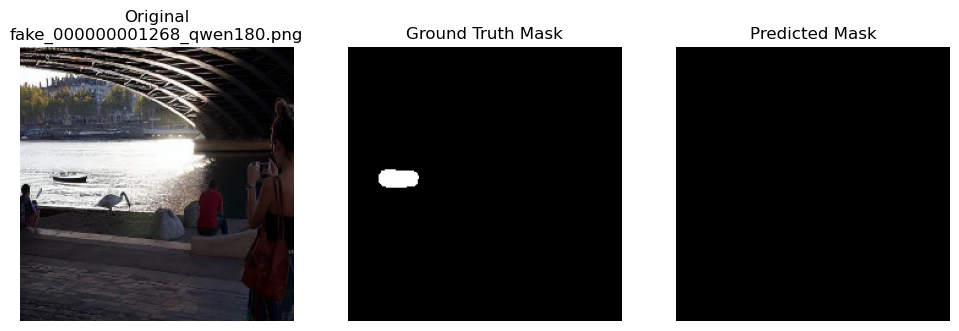

Press ENTER for next image, or type 'q' to quit:  ENTER


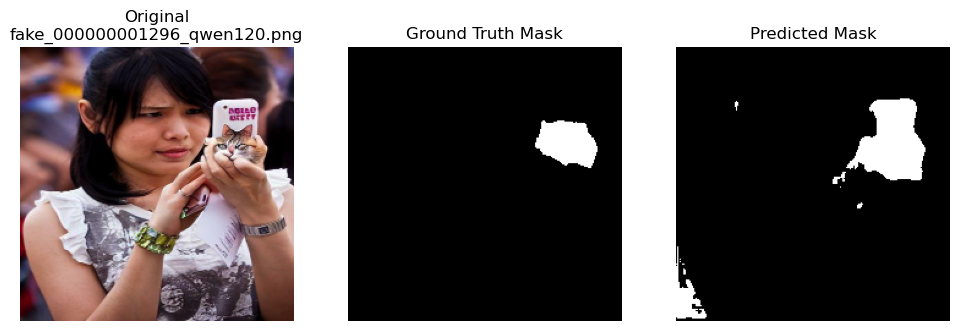

Press ENTER for next image, or type 'q' to quit:  ENTER


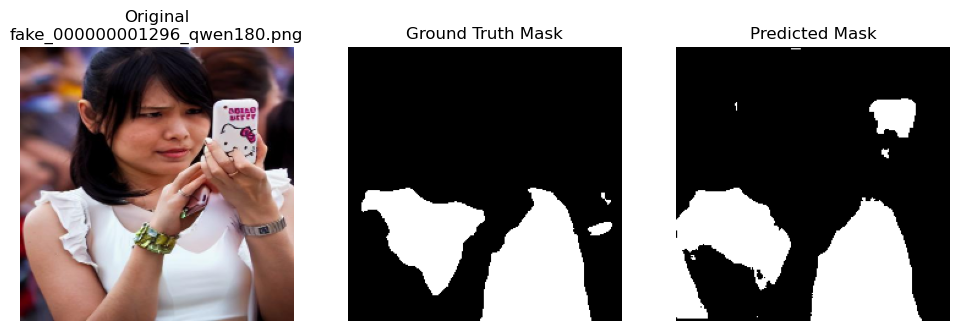

Press ENTER for next image, or type 'q' to quit:  ENTER


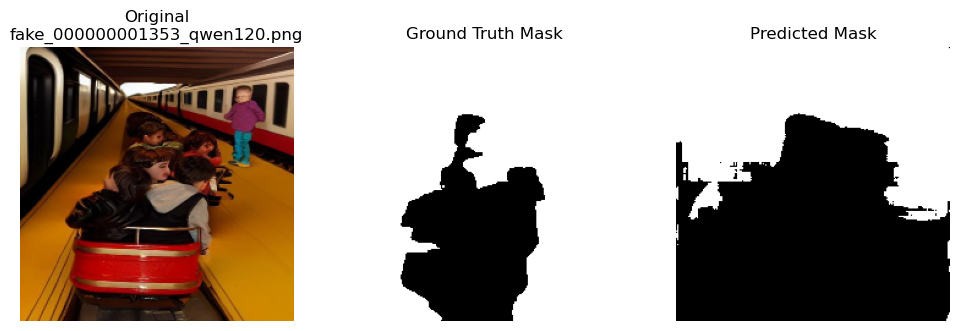

Press ENTER for next image, or type 'q' to quit:  ENTER


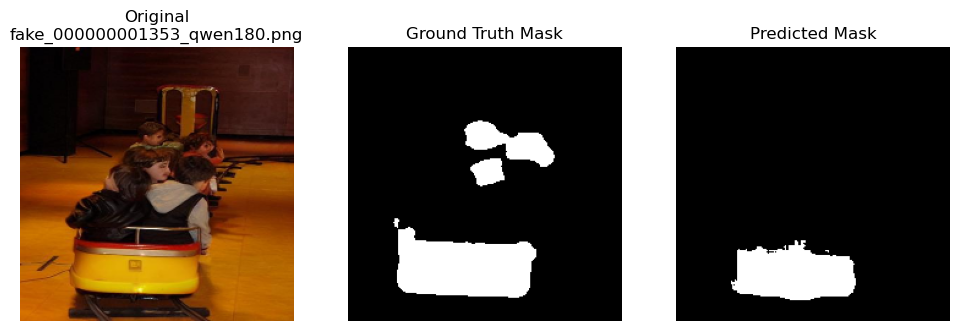

Press ENTER for next image, or type 'q' to quit:  ENTER


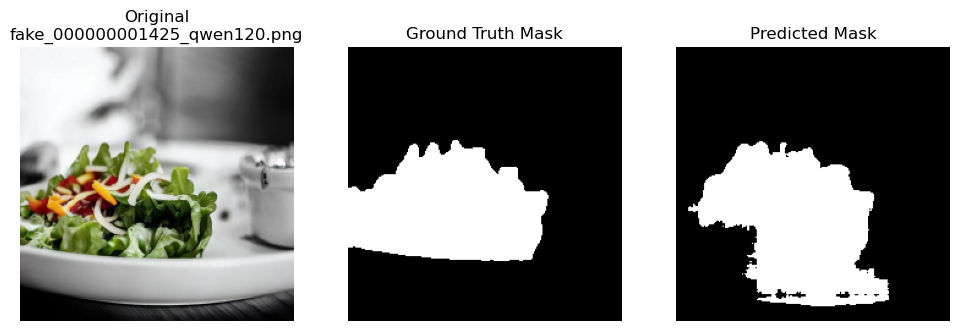

Press ENTER for next image, or type 'q' to quit:  ENTER


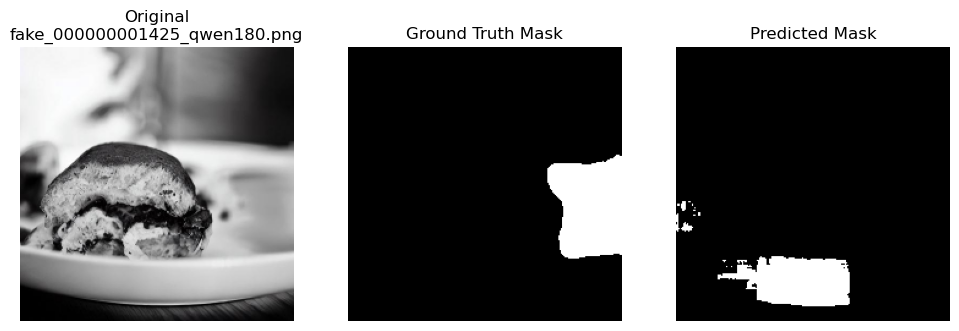

Press ENTER for next image, or type 'q' to quit:  ENTER


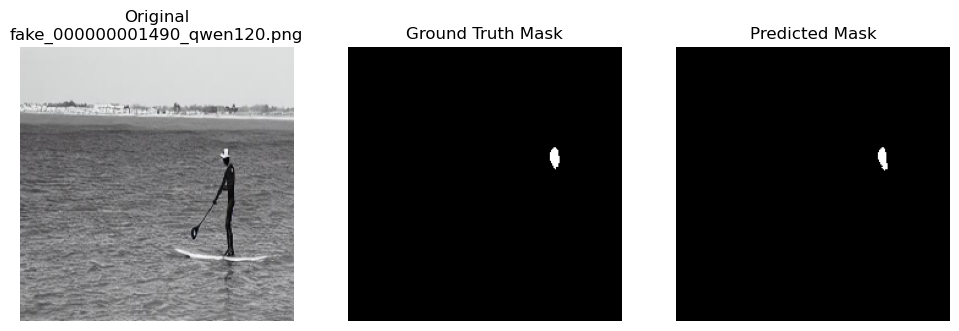

Press ENTER for next image, or type 'q' to quit:  ENTER


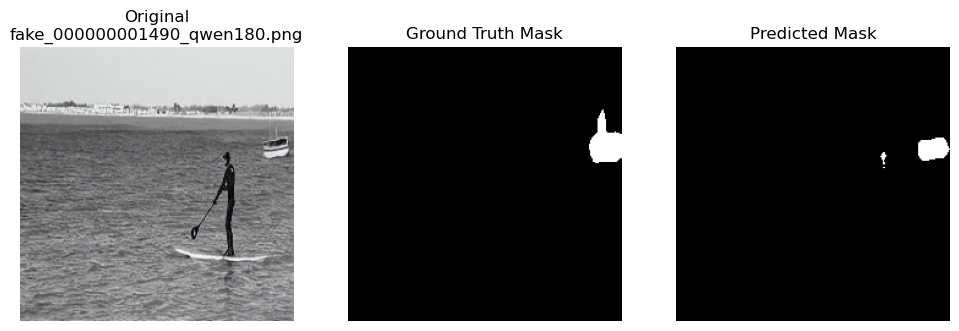

Press ENTER for next image, or type 'q' to quit:  ENTER


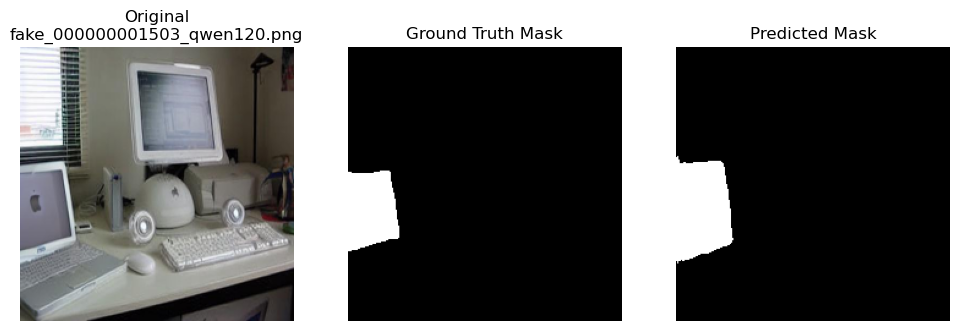

Press ENTER for next image, or type 'q' to quit:  ENTER


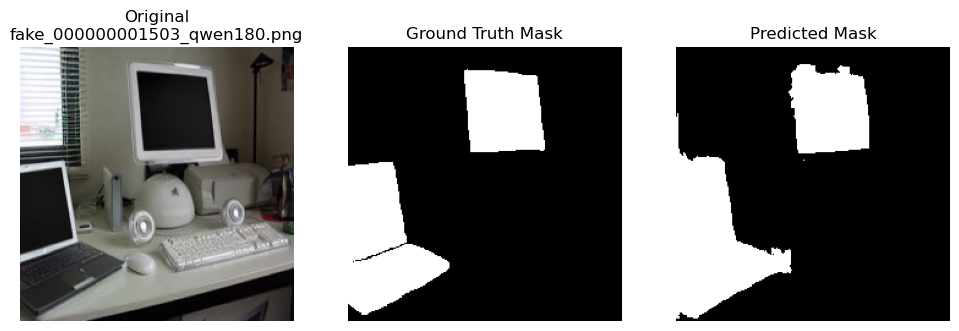

Press ENTER for next image, or type 'q' to quit:  ENTER


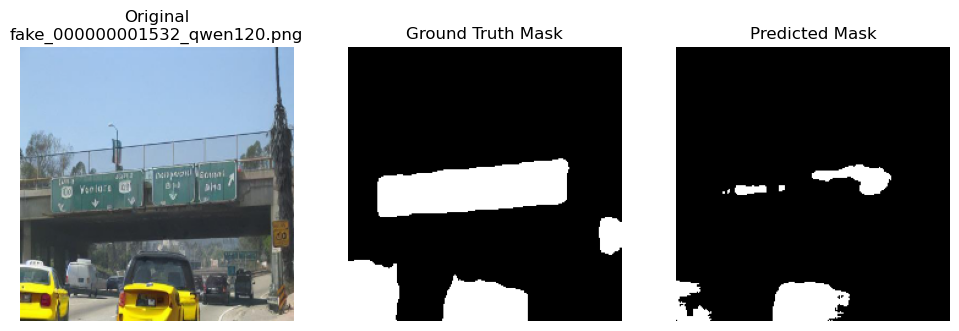

Press ENTER for next image, or type 'q' to quit:  ENTER


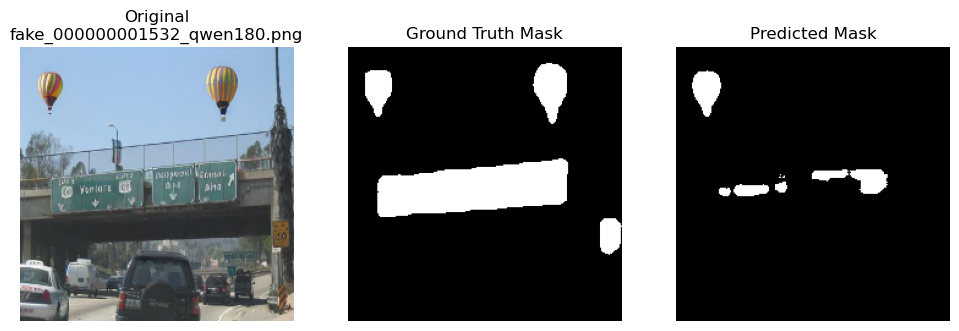

Press ENTER for next image, or type 'q' to quit:  ENTER


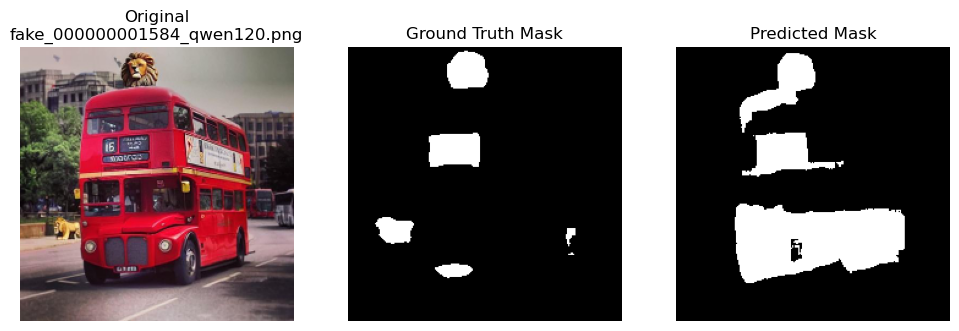

Press ENTER for next image, or type 'q' to quit:  ENTER


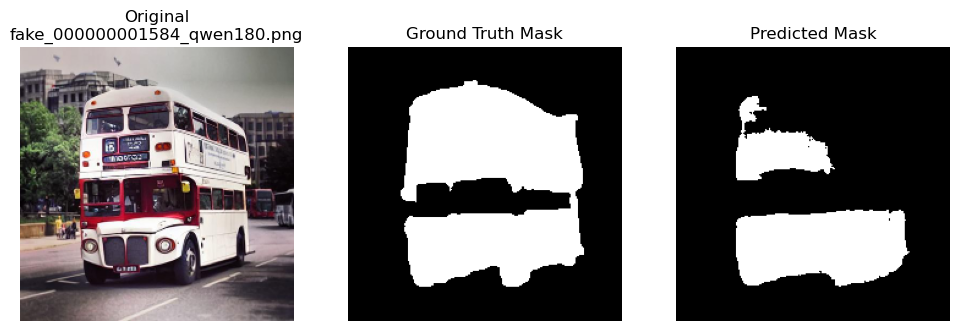

Press ENTER for next image, or type 'q' to quit:  ENTER


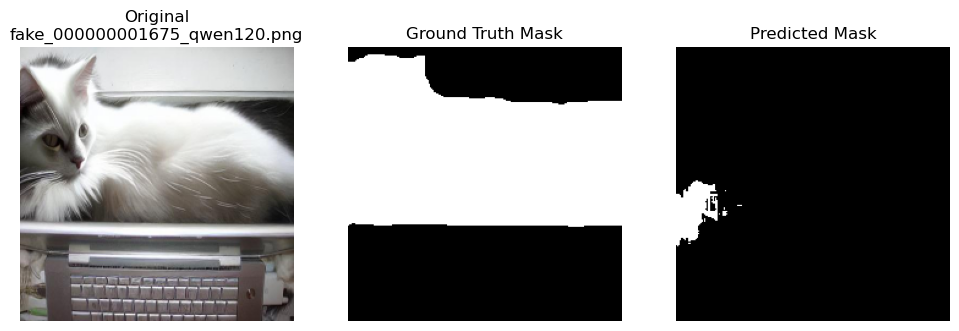

Press ENTER for next image, or type 'q' to quit:  ENTER


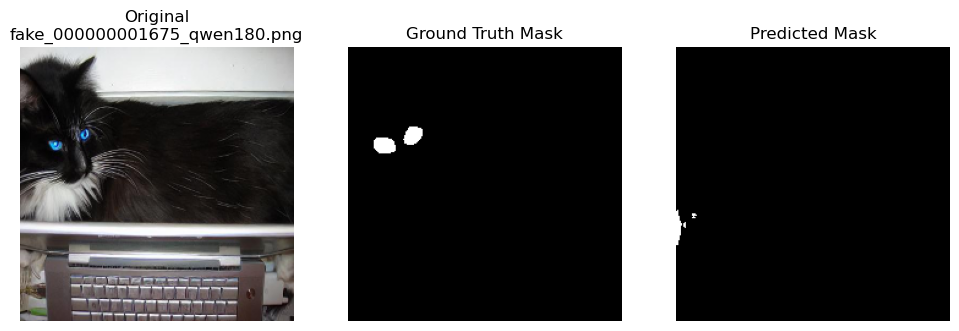

Press ENTER for next image, or type 'q' to quit:  ENTER


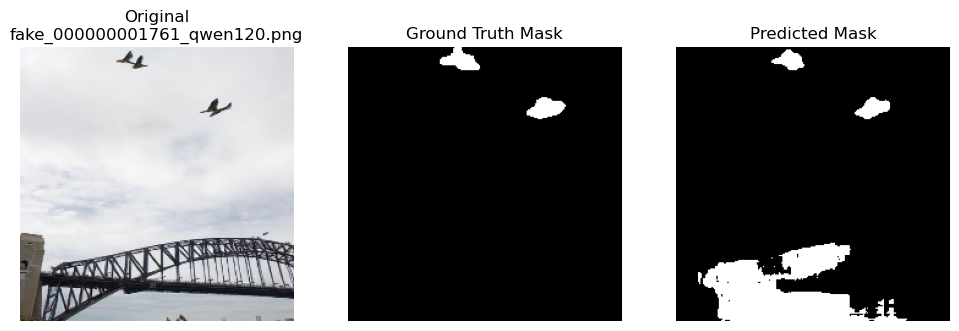

Press ENTER for next image, or type 'q' to quit:  ENTER


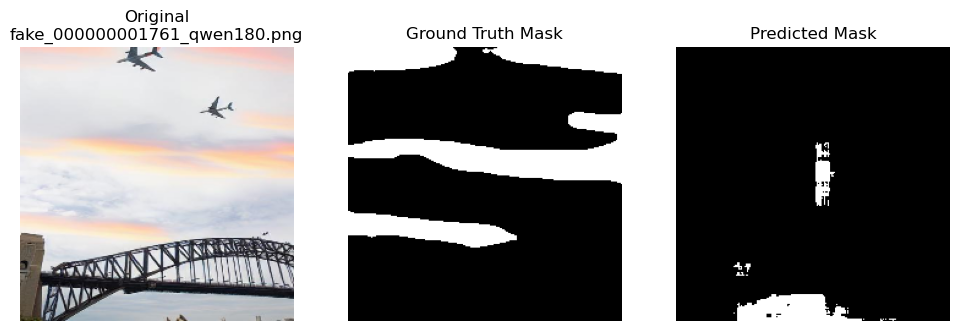

Press ENTER for next image, or type 'q' to quit:  ENTER


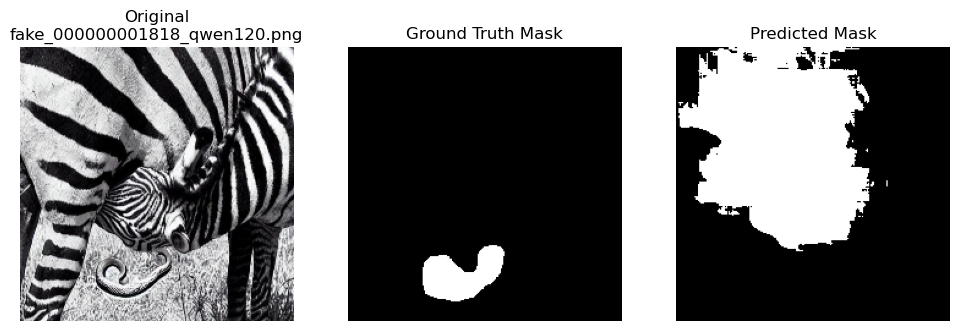

Press ENTER for next image, or type 'q' to quit:  


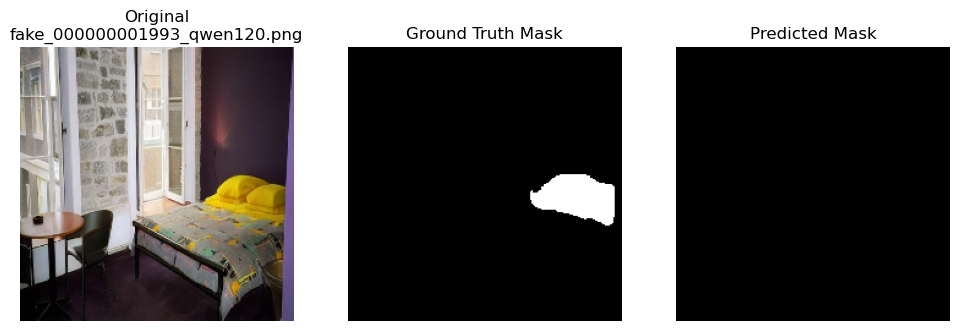

Press ENTER for next image, or type 'q' to quit:  


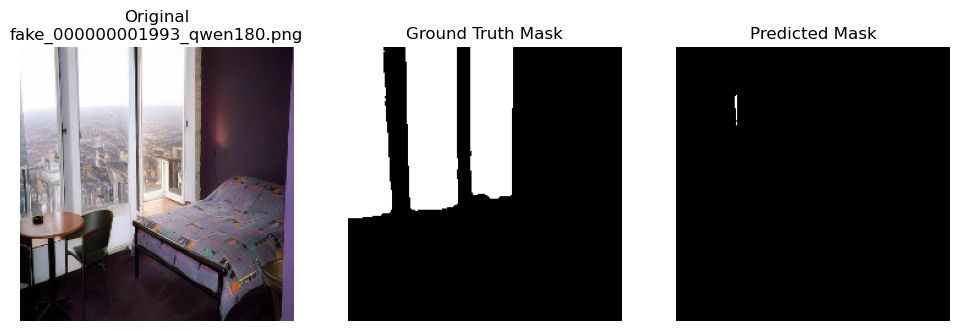

Press ENTER for next image, or type 'q' to quit:  Enter


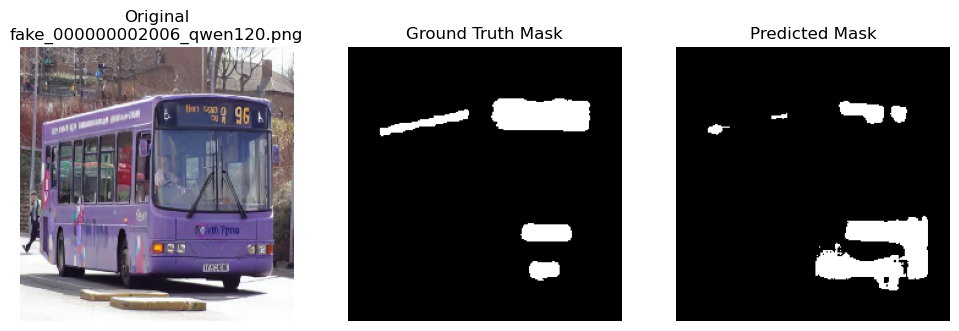

Press ENTER for next image, or type 'q' to quit:  Enter


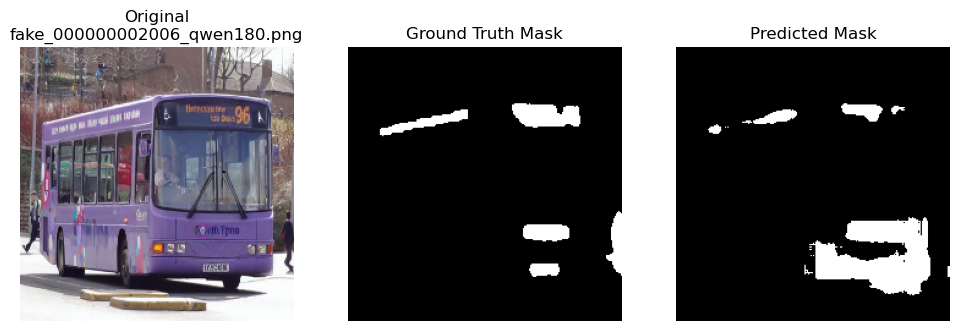

Press ENTER for next image, or type 'q' to quit:  Enter


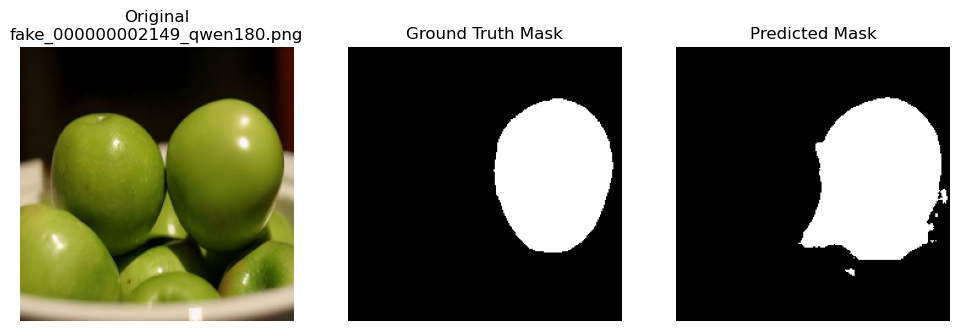

Press ENTER for next image, or type 'q' to quit:  Enter


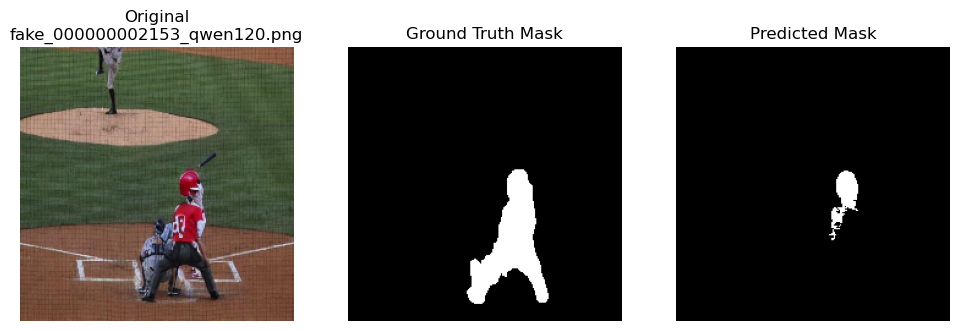

Press ENTER for next image, or type 'q' to quit:  Enter


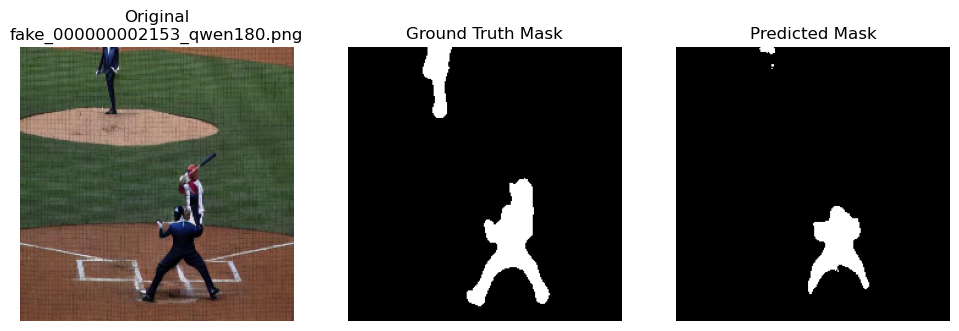

Press ENTER for next image, or type 'q' to quit:  Enter


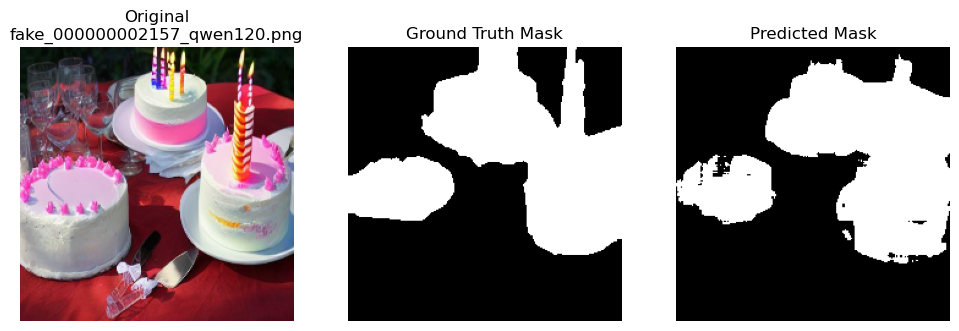

Press ENTER for next image, or type 'q' to quit:  q


In [4]:
# ===============================
# IMAGE-BY-IMAGE TESTING
# ===============================

import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from torchvision import transforms
from torch import nn

# ===============================
# CONFIG
# ===============================
DATASET_DIR = r"E:\processed_segmentation_dataset_224"
MODEL_PATH = r"E:\project\models\tampering_unet_finetuned.pth"

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)

# ===============================
# DATASET
# ===============================
class SegmentationDataset(Dataset):
    def __init__(self, root, split):
        self.image_dir = os.path.join(root, split, "images")
        self.mask_dir = os.path.join(root, split, "masks")
        self.images = sorted(os.listdir(self.image_dir))
        self.transform = transforms.ToTensor()

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.images[idx])

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(mask_path, 0) / 255.0

        image_t = self.transform(image)
        mask_t = torch.from_numpy(mask).float()

        return image, image_t, mask_t, self.images[idx]

# ===============================
# MODEL
# ===============================
class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        def CBR(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
            )

        self.enc1 = CBR(3, 64)
        self.enc2 = CBR(64, 128)
        self.enc3 = CBR(128, 256)
        self.enc4 = CBR(256, 512)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck = CBR(512, 1024)
        self.up4 = nn.ConvTranspose2d(1024, 512, 2, 2)
        self.dec4 = CBR(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, 2)
        self.dec3 = CBR(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.dec2 = CBR(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.dec1 = CBR(128, 64)
        self.final = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b = self.bottleneck(self.pool(e4))
        d4 = self.dec4(torch.cat([self.up4(b), e4], dim=1))
        d3 = self.dec3(torch.cat([self.up3(d4), e3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return self.final(d1)

model = UNet().to(DEVICE)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.eval()

print("✅ Model loaded")

# ===============================
# IMAGE-BY-IMAGE LOOP
# ===============================
test_ds = SegmentationDataset(DATASET_DIR, "test")

for idx in range(len(test_ds)):
    image, image_t, mask, fname = test_ds[idx]

    with torch.no_grad():
        pred = torch.sigmoid(
            model(image_t.unsqueeze(0).to(DEVICE))
        )[0, 0].cpu().numpy()

    pred_bin = (pred > 0.5).astype(np.uint8)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title(f"Original\n{fname}")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_bin, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()

    user_input = input("Press ENTER for next image, or type 'q' to quit: ")
    if user_input.lower() == "q":
        break
ENT

Using device: cuda
✅ Model loaded


Enter image path:  E:\new_dataset\non_labeled\test\real\000000417608.jpg


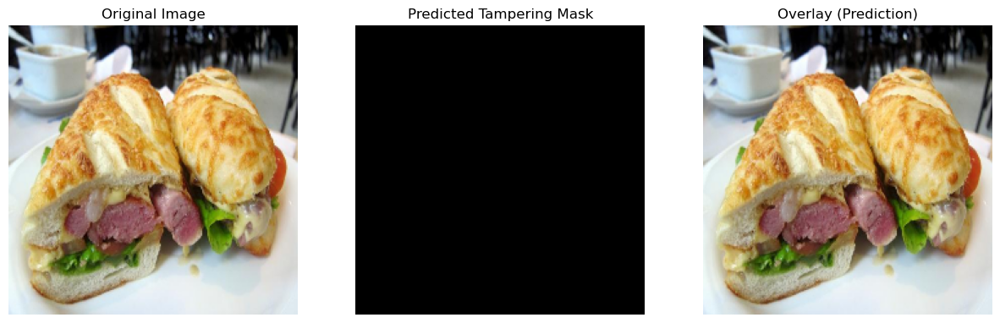

In [39]:
# ===============================
# USER IMAGE TESTING (INFERENCE)
# ===============================

import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from torch import nn

# ===============================
# CONFIG
# ===============================
MODEL_PATH = r"E:\project\models\tampering_unet_finetuned.pth"
IMG_SIZE = 224
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Using device:", DEVICE)

# ===============================
# MODEL DEFINITION
# ===============================
class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        def CBR(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
            )

        self.enc1 = CBR(3, 64)
        self.enc2 = CBR(64, 128)
        self.enc3 = CBR(128, 256)
        self.enc4 = CBR(256, 512)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck = CBR(512, 1024)
        self.up4 = nn.ConvTranspose2d(1024, 512, 2, 2)
        self.dec4 = CBR(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, 2)
        self.dec3 = CBR(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.dec2 = CBR(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.dec1 = CBR(128, 64)
        self.final = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b = self.bottleneck(self.pool(e4))
        d4 = self.dec4(torch.cat([self.up4(b), e4], dim=1))
        d3 = self.dec3(torch.cat([self.up3(d4), e3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return self.final(d1)

# ===============================
# LOAD MODEL
# ===============================
model = UNet().to(DEVICE)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.eval()

print("✅ Model loaded")

# ===============================
# USER INPUT IMAGE
# ===============================
image_path = input("Enter image path: ").strip()

image = cv2.imread(image_path)
if image is None:
    raise ValueError("❌ Image not found. Check the path.")

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_resized = cv2.resize(image_rgb, (IMG_SIZE, IMG_SIZE))

transform = transforms.ToTensor()
image_tensor = transform(image_resized).unsqueeze(0).to(DEVICE)

# ===============================
# INFERENCE
# ===============================
with torch.no_grad():
    pred = torch.sigmoid(model(image_tensor))[0, 0].cpu().numpy()

pred_mask = (pred > 0.5).astype(np.uint8)

# ===============================
# OVERLAY (OPTIONAL BUT USEFUL)
# ===============================
overlay = image_resized.copy()
overlay[pred_mask == 1] = [255, 0, 0]  # red highlight
overlay = cv2.addWeighted(image_resized, 0.7, overlay, 0.3, 0)

# ===============================
# VISUALIZE
# ===============================
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image_resized)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(pred_mask, cmap="gray")
plt.title("Predicted Tampering Mask")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(overlay)
plt.title("Overlay (Prediction)")
plt.axis("off")

plt.show()
